<a href="https://colab.research.google.com/github/RizqiRHuda/PVCK_Semester5/blob/main/week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **MODUL11 – MetodeDeteksiObjek: TemplateMatching,Edge Detection,CornerDetection,GridDetection,ContourDetection**

Nama          : Rizqi Rohmatul Huda

Kelas         : TI-3C

Nomor Absen   : 21

NIM           : 2141720264

### **D. LATIHAN PRAKTIKUM**

In [1]:
#import library yang dibutuhkan
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


In [2]:
#akses drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


2. Implementasikan 6 metode template matching pada OpenCV dengan menggunakan gambar cats_and_bunnies.jpg dan cat2_templatejpg.jpg sebagai templatenya.


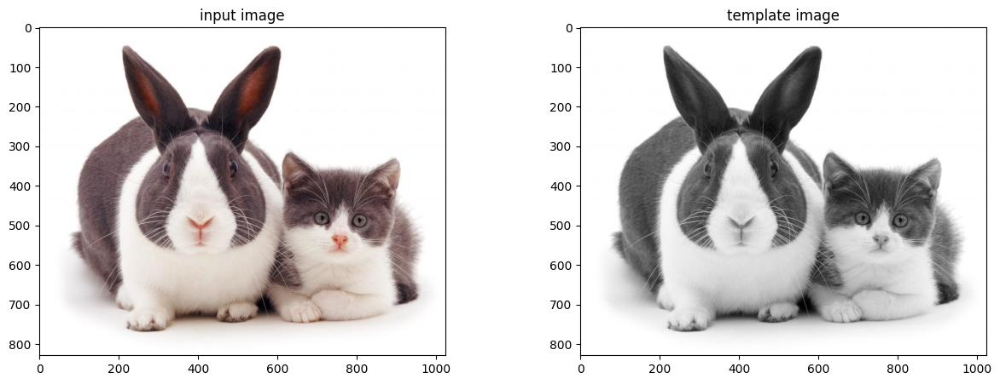

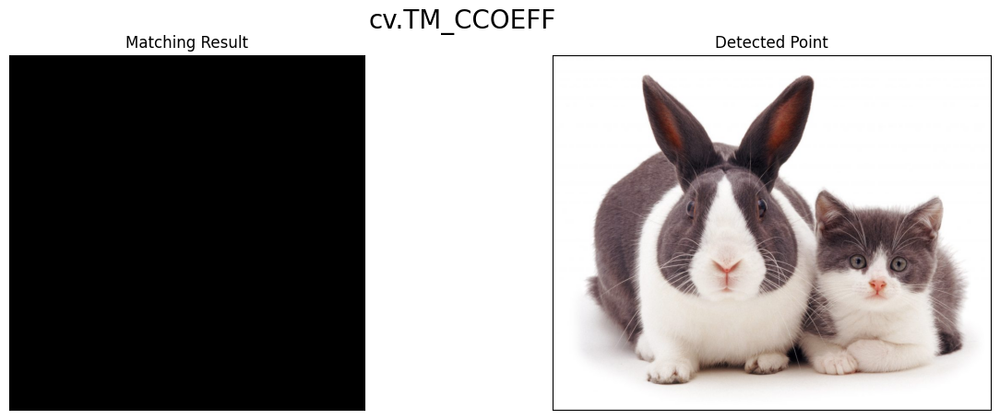

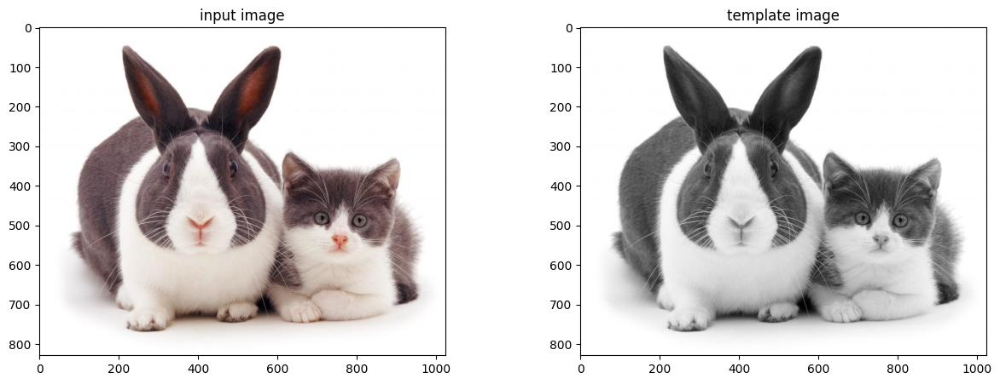

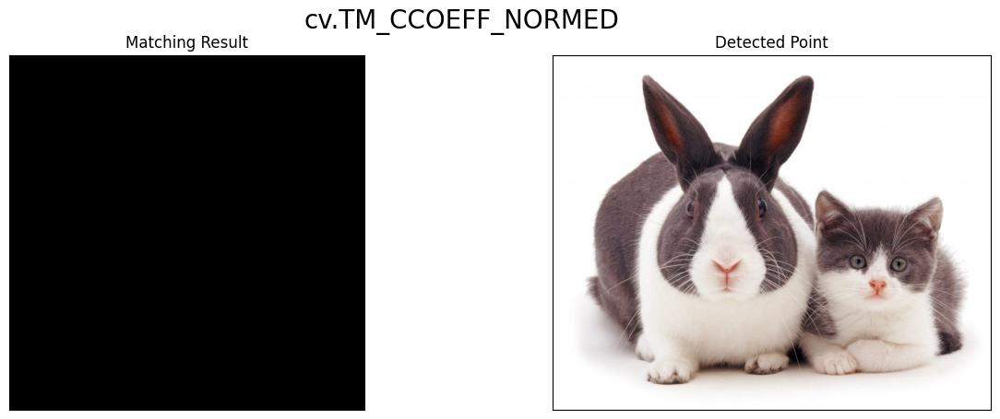

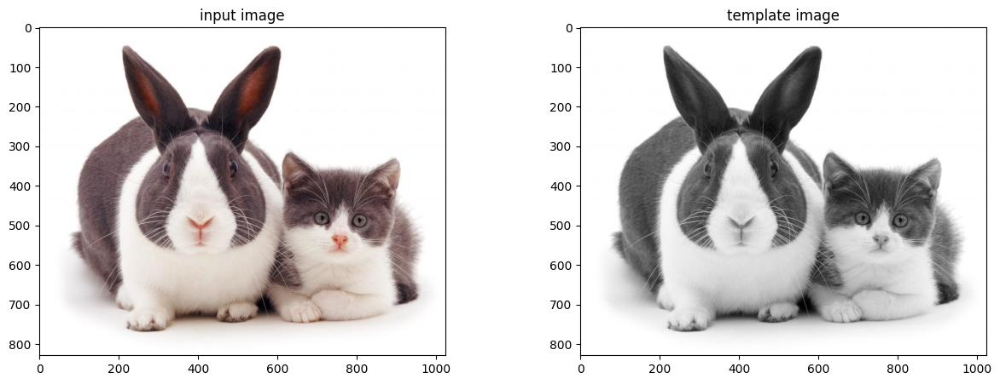

...

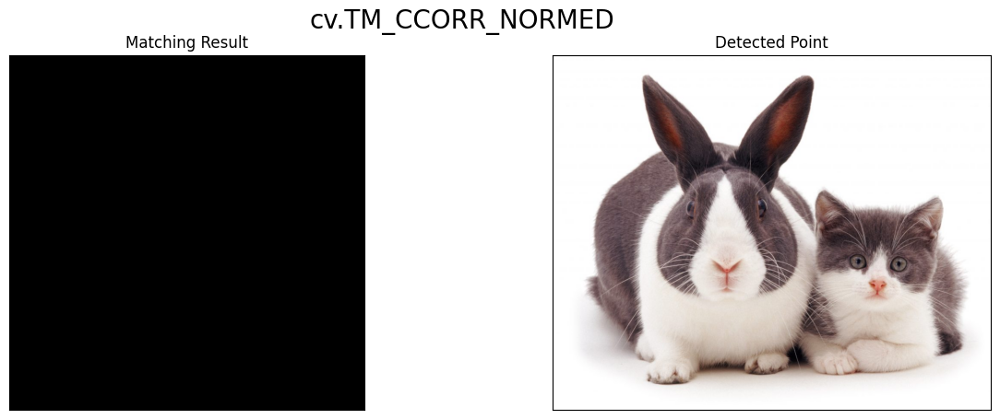

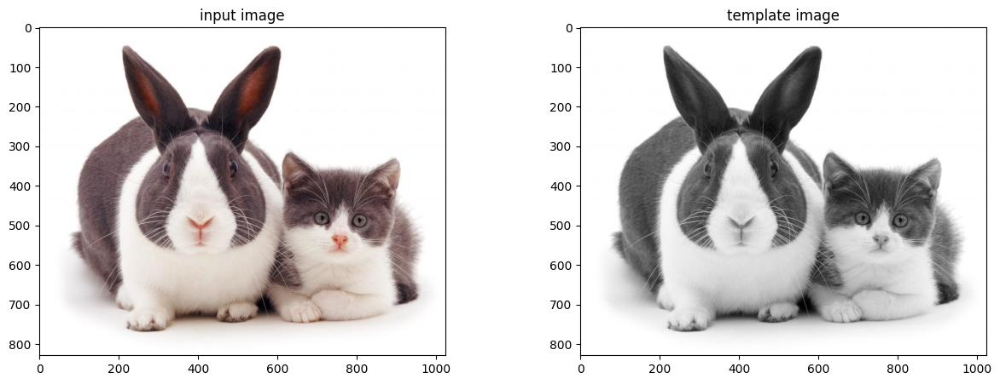

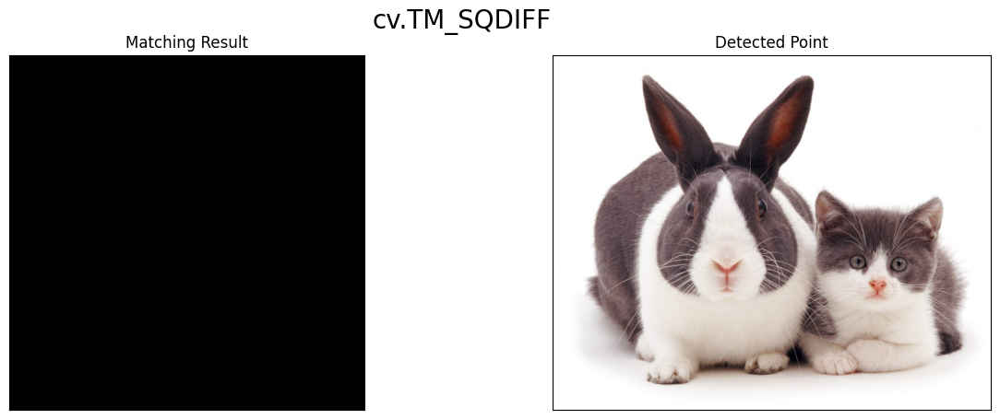

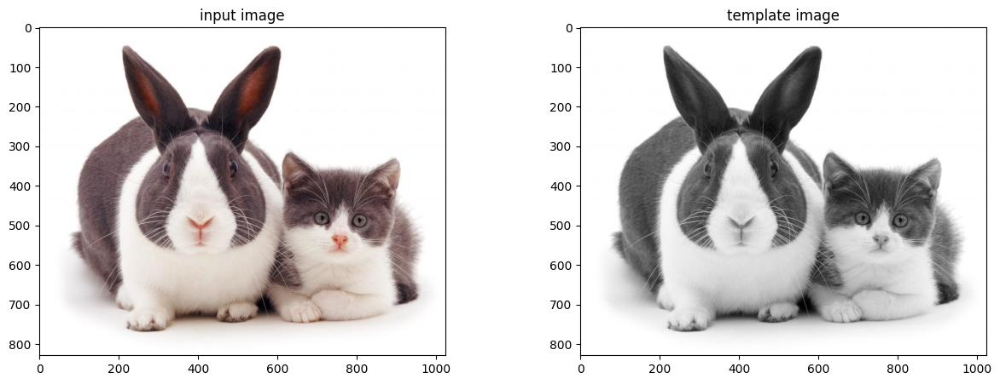

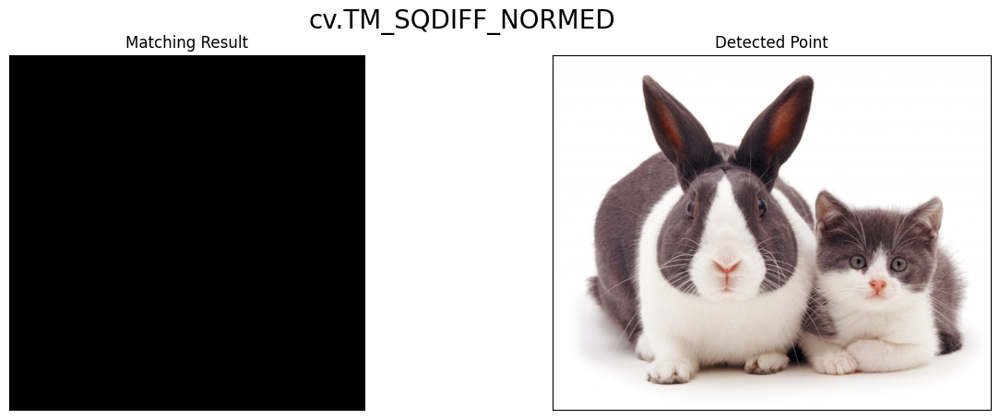

In [3]:
def template_matching(img, template, method):
    img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    img_copy = img.copy()
    w, h = template.shape[::-1]

     # print input image dan template
    f, axarr = plt. subplots(1,2,figsize=(15,5)) #membuat 2 plot untuk citra input dan template
    axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
    axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

    res = cv.matchTemplate(img_gray, template, method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)


    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img_copy, top_left, bottom_right, (0, 0, 255))

    return img_copy, res

img = cv.imread('/content/drive/MyDrive/img_python/content/animal/cats_and_bunnies.jpg')
template = cv.imread('/content/drive/MyDrive/img_python/content/animal/cats_and_bunnies.jpg', 0)

methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
           'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for method_str in methods:
    method = eval(method_str)
    result_img, result_res = template_matching(img, template, method)

    plt.figure(figsize=(15, 5))
    plt.subplot(121), plt.imshow(result_res, cmap='gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(cv.cvtColor(result_img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    plt.suptitle(method_str, fontsize=20)
    plt.show()

3. Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai berikut:


Text(0.5, 1.0, 'Template Image')

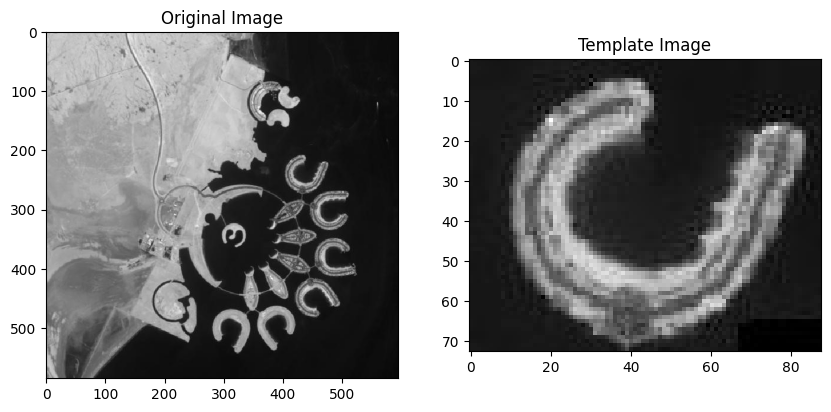

In [4]:
from skimage.feature import match_template

img = cv.imread('/content/drive/MyDrive/img_python/content/animal/bahrain.jpg',0)
template_img = cv.imread('/content/drive/MyDrive/img_python/content/animal/bahrain-template.jpg',0)

fig, axarr = plt.subplots(1, 2, figsize=(10, 6))
axarr[0].imshow(img, cmap='gray')
axarr[0].set_title("Original Image")
axarr[1].imshow(template_img, cmap='gray')
axarr[1].set_title("Template Image")

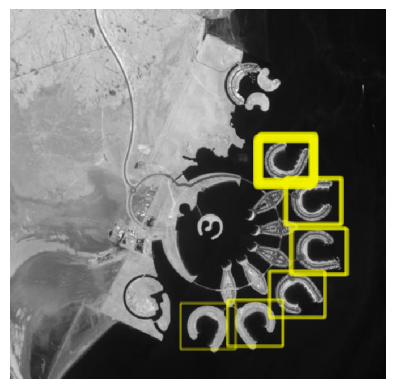

In [5]:
# menghitung kemiripan citra dengan template
result = match_template(img, template_img)

# menentukan hasil kecocokan
threshold = 0.45
locations = np.where(result >= threshold)

# menampilkan gambar kecocokan
fig, ax = plt.subplots()
ax.imshow(img, cmap=plt.cm.gray)
ax.set_axis_off()
height, width = template_img.shape
for loc in zip(*locations[::-1]):
    rect = plt.Rectangle(loc, width, height, edgecolor='yellow', facecolor='none', linewidth=0.1)
    ax.add_patch(rect)

plt.show()

4. . Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga menghasilkan luaran sebagai berikut:

**a. Sobel Edge Detection**

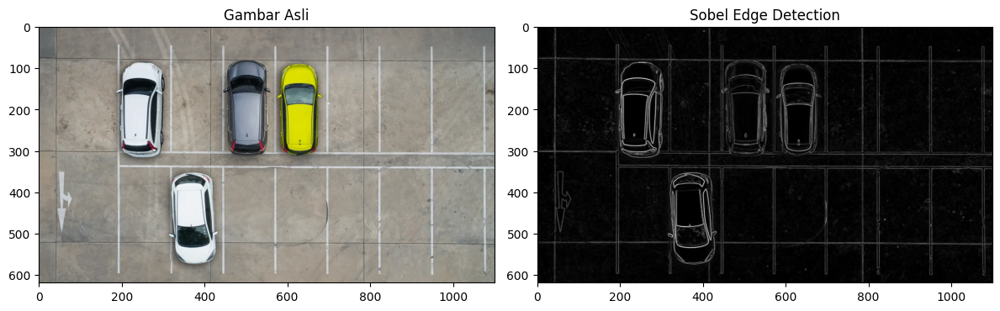

In [6]:
image = cv.imread('/content/drive/MyDrive/img_python/content/animal/car-park.jpg')

img_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
img_car = cv.cvtColor(image, cv.COLOR_BGR2RGB)

# Menerapkan Sobel Edge Detection
sobel_x = cv.Sobel(img_gray, cv.CV_64F, 1, 0, ksize=3)
sobel_y = cv.Sobel(img_gray, cv.CV_64F, 0, 1, ksize=3)
sobel_combined = cv.magnitude(sobel_x, sobel_y)

# Tampilkan gambar asli dan hasil deteksi tepi
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.imshow(img_car, cmap='gray')
plt.title('Gambar Asli')

plt.subplot(2, 2, 2)
plt.imshow(sobel_combined, cmap='gray')
plt.title('Sobel Edge Detection')

plt.tight_layout()
plt.show()

**b. Canny Edge Detection**

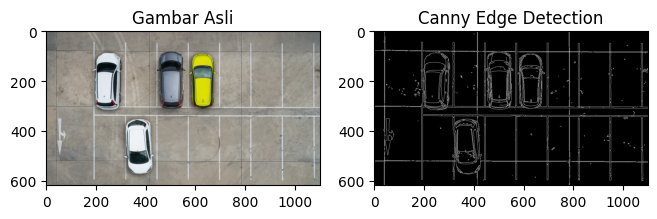

In [7]:
# Tampilkan gambar-gambar hasil
plt.figure(figsize=(12, 5))

plt.subplot(131)
plt.imshow(img_car, cmap='gray')
plt.title('Gambar Asli')

# Canny Edge Detection
canny = cv.Canny(image, 100, 200)


plt.subplot(132)
plt.imshow(canny, cmap='gray')
plt.title('Canny Edge Detection')

plt.show();

**c. Laplacian Edge Detection**


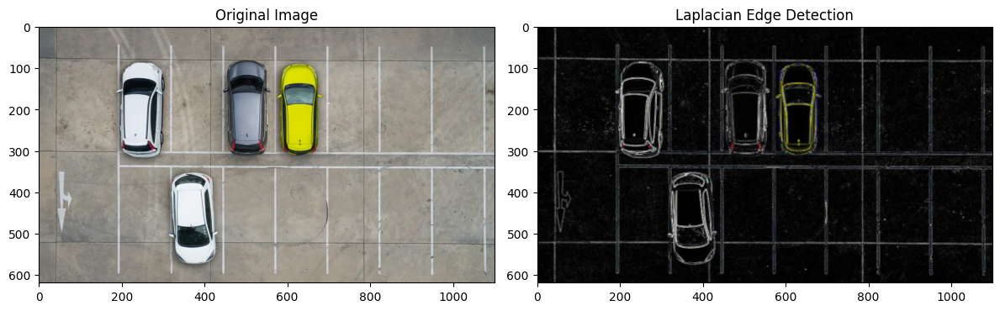

In [8]:

import cv2 as cv
import matplotlib.pyplot as plt

car_park = cv.imread('/content/drive/MyDrive/img_python/content/animal/car-park.jpg')

# Reduce noise in image
img_car_noise = cv.GaussianBlur(car_park, (3, 3), 0)

# Filter the image using filter2D, which has inputs: (grayscale image, bit-depth, kernel)
filtered_image = cv.Laplacian(img_car_noise, cv.CV_16S, ksize=3)

# Converting back to uint8
filtered_image = cv.convertScaleAbs(filtered_image)

# Tampilkan gambar asli dan hasil deteksi tepi
plt.figure(figsize=(12, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(car_park, cv.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('on')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(filtered_image, cv.COLOR_BGR2RGB))
plt.title('Laplacian Edge Detection')
plt.axis('on')

plt.tight_layout()
plt.show()




5. Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection pada OpenCV dengan menggunakan gambar chess-board.jpg, sehingga menghasilkan luaran sebagai berikut:


**a. Harris Corner Detection**


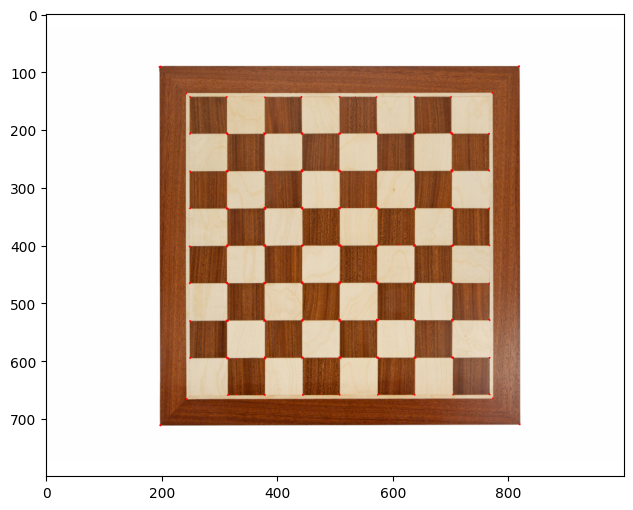

In [9]:
#load citra input
input_img = cv.imread('/content/drive/MyDrive/img_python/content/animal/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img,3,1,0.04)

gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img,2,3, 3)
#hasil harris corner dilakukan dilasi untuk menandai sudut
harris_output = cv.dilate(harris_output, None)

#Threshold untuk mengoptimalkan nilai
input_img[dst>0.01*dst.max()]=[0,0,255]

plt.figure(figsize=(11,6))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

**b. Shi-Tomasi Detection**

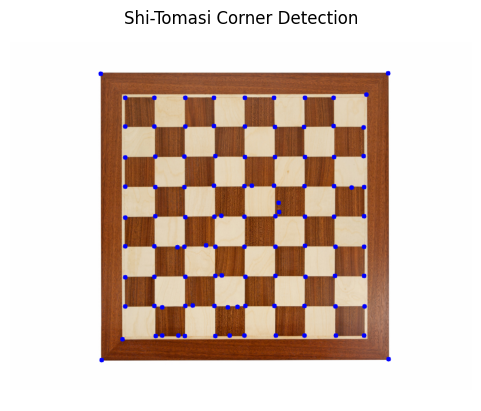

In [10]:
# Baca gambar
image = cv.imread('/content/drive/MyDrive/img_python/content/animal/chess-board.jpg')
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Deteksi sudut menggunakan metode Shi-Tomasi
corners = cv.goodFeaturesToTrack(gray, 100, 0.01, 10)
corners = np.int0(corners)

# Gambar sudut pada gambar
for corner in corners:
    x, y = corner.ravel()
    cv.circle(image, (x, y), 5, 255, -1)

# Tampilkan hasil Shi-Tomasi Corner Detection
plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
plt.title('Shi-Tomasi Corner Detection')
plt.axis('off')
plt.show()





6. Implementasikan metode Hough Transform pada OpenCV dengan menggunakan gambar sudoku.jpg. Tahapan proses grid detection sesuai yang terdapat pada ulasan
teori, sehingga menghasilkan luaran sebagai berikut:

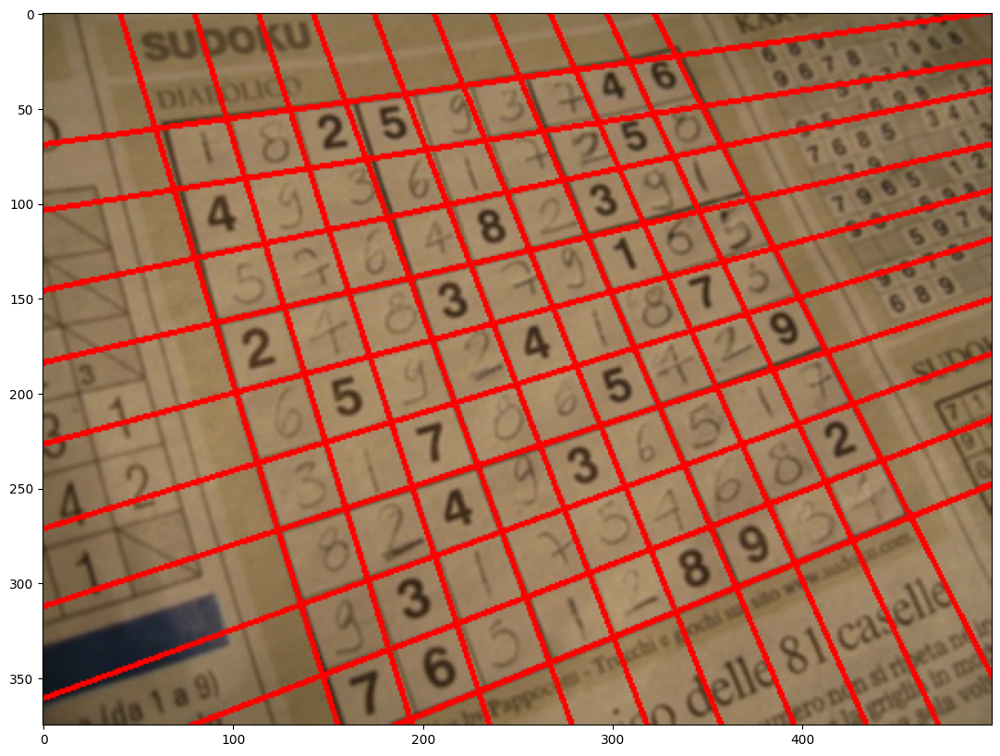

In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Baca gambar sudoku.jpg
img_s = cv.imread('/content/drive/MyDrive/img_python/content/animal/sudoku.jpg')
img_gs = cv.cvtColor(img_s, cv.COLOR_BGR2GRAY)

edges = cv.Canny(img_gs, 90, 150, apertureSize=3)

kernel = np.ones((3, 3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)

kernel = np.ones((5, 5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

lines = cv.HoughLines(edges, 1, np.pi / 180, 150)

if lines is None or not lines.any():
    print('No lines were found')
    exit()

rho_threshold = 15
theta_threshold = 0.1

# Filter garis yang serupa
similar_lines = {i: [] for i in range(len(lines))}
for i in range(len(lines)):
    for j in range(len(lines)):
        if i == j:
            continue
        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)

indices = [i for i in range(len(lines))]
indices.sort(key=lambda x: len(similar_lines[x]))

line_flags = len(lines) * [True]
for i in range(len(lines) - 1):
    if not line_flags[indices[i]]:
        continue
    for j in range(i + 1, len(lines)):
        if not line_flags[indices[j]]:
            continue
        rho_i, theta_i = lines[indices[i]][0]
        rho_j, theta_j = lines[indices[j]][0]
        if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
            line_flags[indices[j]] = False

filtered_lines = [lines[i] for i in range(len(lines)) if line_flags[i]]

for line in filtered_lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv.line(img_s, (x1, y1), (x2, y2), (0, 0, 255), 2)

# Menampilkan gambar dengan garis yang terdeteksi
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(img_s, cv.COLOR_BGR2RGB))
plt.axis('on')
plt.show()


7. Implementasikan fungsi findContours() pada OpenCV untuk contour detection dengan menggunakan gambar laptop.jpg, sehingga menghasilkan luaran sebagai berikut:

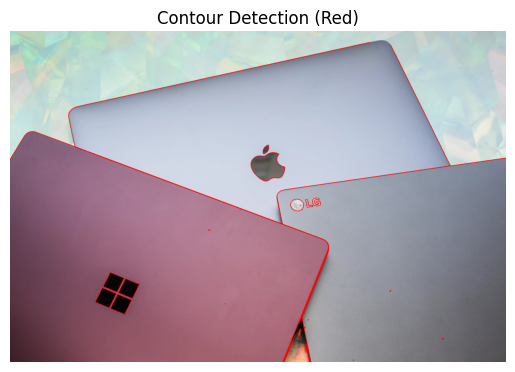

In [12]:
import cv2
import matplotlib.pyplot as plt

# Baca gambar laptop.jpg
img = cv2.imread('/content/drive/MyDrive/img_python/content/animal/laptop.jpg')

# Konversi gambar ke citra skala abu-abu
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Deteksi tepi menggunakan Canny
edges = cv2.Canny(gray, 30, 200)

# Temukan kontur menggunakan findContours
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Gambar kontur pada gambar asli (menggunakan warna merah)
cv2.drawContours(img, contours, -1, (0, 0, 255), 3)

# Tampilkan hasil deteksi kontur
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title('Contour Detection (Red)')
plt.axis('off')
plt.show()


### **E. Pengayaan Materi KTP**

1. Siapkan file dataset, contoh pada praktik ini menggunakan Maftuchin Tuban

Text(0.5, 1.0, 'Original Image')

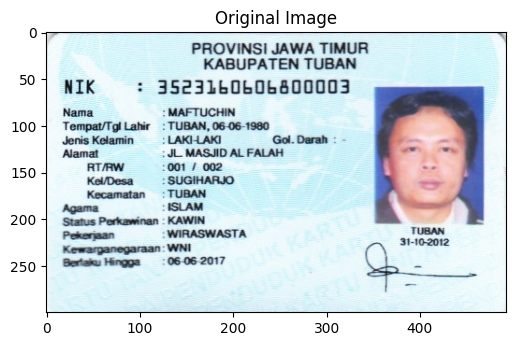

In [13]:
filename = '/content/drive/MyDrive/img_python/content/img_week7/ktp4.png'
img = cv2.imread(filename)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(15, 8))
plt.subplot(2, 2, 1), plt.imshow(img)
plt.title('Original Image')

2. Muat 2 library berikut sebagai tahapan persiapan


In [14]:
import cv2
import os
from google.colab.patches import cv2_imshow

3. Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori dataset tersebut

In [15]:

# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/img_python/content/img_week7"

# Nama file yang ingin di proses
name_file = "ktp4.png"

# Looping file di direktori
if name_file in os.listdir(path_plate):
    image_path = os.path.join(path_plate, name_file)
    src = cv2.imread(os.path.join(path_plate, name_file))
    blurred = src.copy()
    gray = blurred.copy()

4. Masih pada looping file direktori, terapkan Gaussian Blur untuk setiap file supaya noise pickle
dapat direduksi

In [16]:
# Filtering
for i in range(10):
  blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

5. Lakukan konversi grayscale untuk setiap hasil citra yang tereduksi noise dan lanjutkan dengan binerisasi citra (thresholding)


6. Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter
atau obyek tidak berhimpitan.

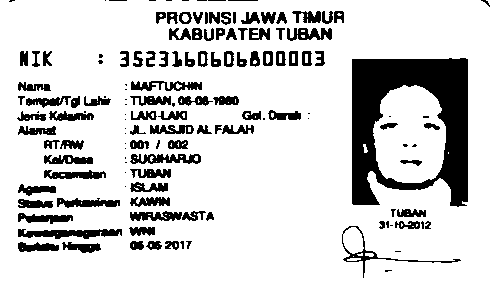

In [17]:
# Lokasi hasil pelat
src = cv.imread('/content/drive/MyDrive/img_python/content/img_week7/ktp4.png')
blurred = cv2.GaussianBlur(src, (5, 5), 0.5)
# Ubah ke grayscale
gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))


cv2_imshow(erode)

7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.
Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di
dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu
penanganan yang berbeda.

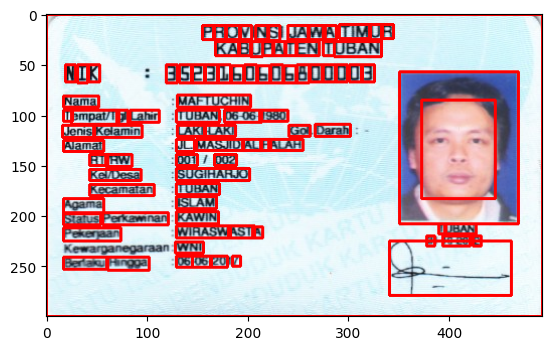

In [18]:
# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv.rectangle(src, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 10 and w >= 7 and float(ras) <= 7:
      cv.rectangle(src, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 12 and w >= 7 and float(ras) <= 8:
      cv.rectangle(src, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)


      #cv.drawContours(ktp, contours, -1, (0, 255, 0), 2)

# Menampilkan gambar KTP dengan kontur menggunakan plt
ktp_rgb = cv.cvtColor(src, cv.COLOR_BGR2RGB)
plt.imshow(ktp_rgb)
plt.show()

## **Tugas!**

Kelompok 5

In [ ]:

!sudo apt-get install tesseract-ocr-ind

In [ ]:
pip install pytesseract

In [21]:
import pytesseract
from pytesseract import Output
from google.colab.patches import cv2_imshow


**Cara 1**

1. Preprocessing dan ekstraksi kontur

In [24]:
from google.colab.patches import cv2_imshow

# Preprocessing
ktp_image = cv.imread('/content/drive/MyDrive/img_python/content/img_week7/ktp6.png')

blurred_image = cv.GaussianBlur(ktp_image, (5, 5), 0.5)

gray_image = cv.cvtColor(blurred_image, cv.COLOR_BGR2GRAY)
ret, bw_image = cv.threshold(gray_image.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

erode_image = cv.erode(bw_image.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode_image.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)


2. Loop kontur dan menampilkan gambar

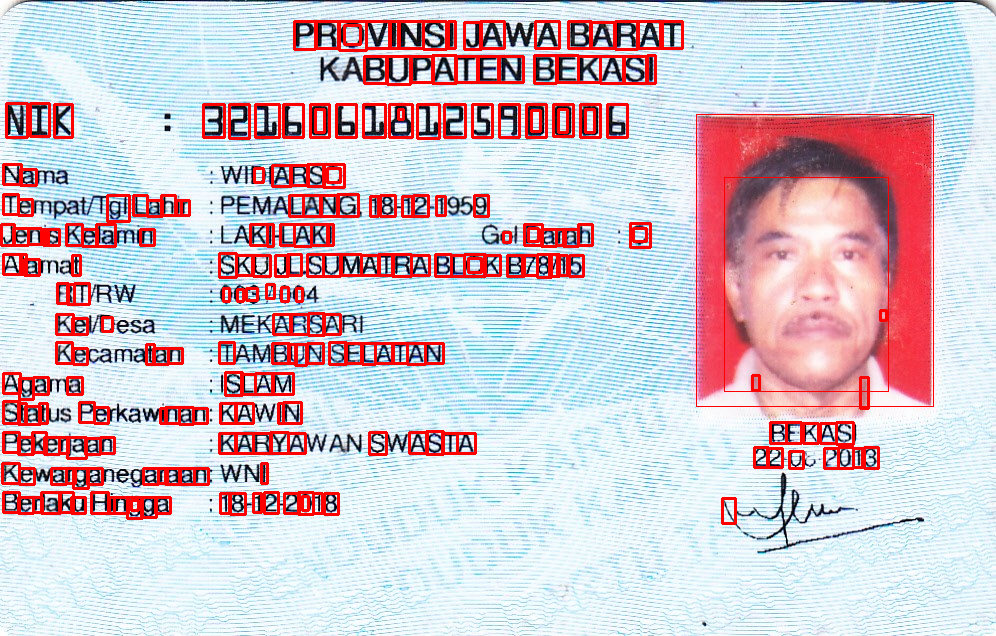

In [25]:
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
        cv.rectangle(ktp_image, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 20 and w >= 5 and float(ras) <= 1:
        cv.rectangle(ktp_image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
        cv.rectangle(ktp_image, (x, y), (x + w, y + h), (0, 0, 255), thickness=2)

# Menampilkan gambar
cv2_imshow(ktp_image)


**Cara 2**

 

NIK :

Nama
Tempat/Tgl Lahu
Jenis Kelamin
Alamat
RTRW
Kel/Desa
Kecamatan
Agama

PROVINSI JAWA BARAT
KABUPATEN BEKASI

32160b1912590006

: WIDIARSO

: PEMALANG, 18-12-1959

: LAKI-LAKI GolDarah : 0
: SKU JL.SUMATRA BLOK B78/15
1003004

: MEKARSARI

1 TAMBUN SELATAN

:ISLAM

Status Perkawinan: KAWIN

Pekerjaan

: KARYAWAN SWASTA

Kewarganegaraan: WNI

Berlaku Hingga

118-12-2018

 

BEKASI
22-6u 0013

dict_keys(['level', 'page_num', 'block_num', 'par_num', 'line_num', 'word_num', 'left', 'top', 'width', 'height', 'conf', 'text'])


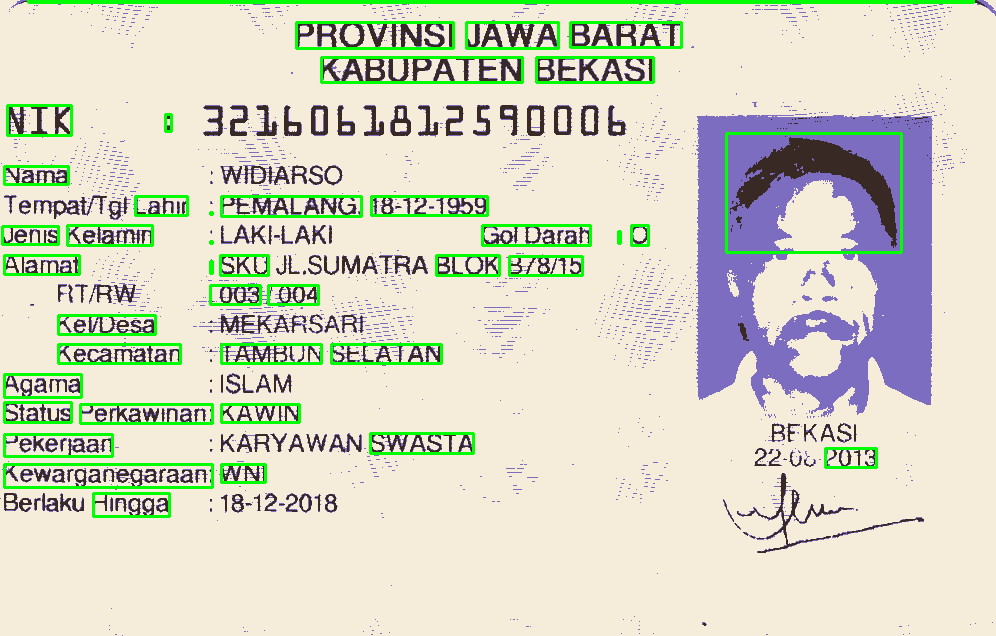

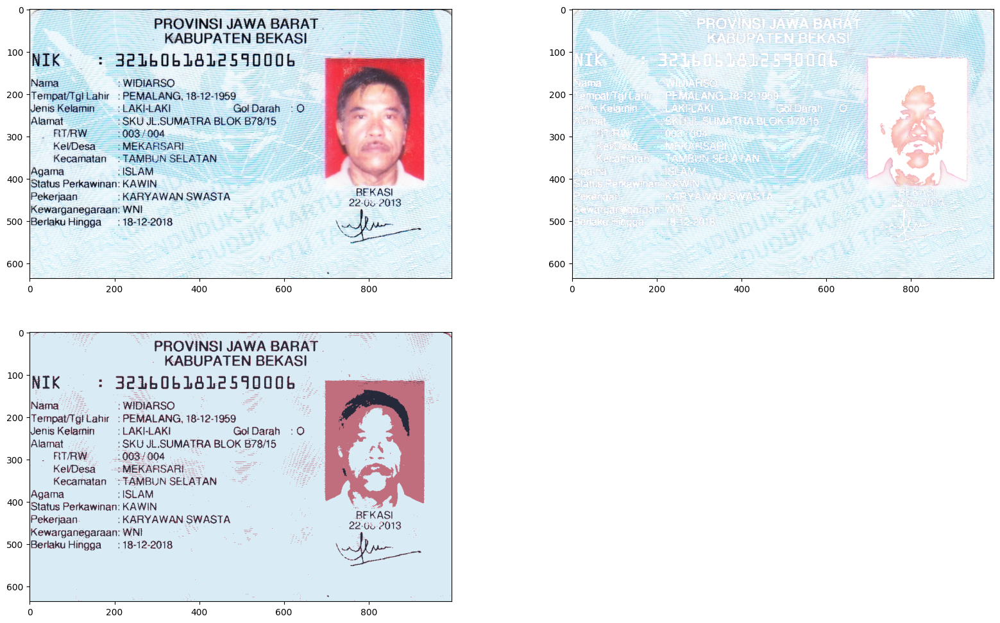

In [30]:
# Kmeans Image Segmentation
img = cv.imread('/content/drive/MyDrive/img_python/content/img_week7/ktp6.png')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# reshape array ke bentuk 2D
pixel_val = img.reshape((-1, 3))
# convert to float
pixel_val = np.float32(pixel_val)

criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 100, 0.2)

k = 3
_, labels, (centers) = cv.kmeans(pixel_val, k, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)
# Konversi titik centroid ke dalam Integer
centers = np.uint8(centers)
# flattening label array
labels = labels.flatten()
# konversi warna pixel asli ke warna dari tiap centroidnya
segmented_img = centers[labels.flatten()]
segmented_img = segmented_img.reshape(img.shape)

masked_img = np.copy(img)
masked_img = masked_img.reshape((-1, 3))
# cluster = 2
masked_img[labels != 2] = [255, 255, 255]
masked_img = masked_img.reshape(img.shape)

plt.figure(figsize = (20, 12))
plt.subplot(2, 2, 1), plt.imshow(img)
plt.subplot(2, 2, 2), plt.imshow(masked_img)
plt.subplot(2, 2, 3), plt.imshow(segmented_img)

gray = cv.cvtColor(segmented_img, cv.COLOR_BGR2GRAY)
th, threshed = cv.threshold(gray, 127, 255, cv.THRESH_TRUNC)
text1 = pytesseract.image_to_data(threshed,output_type='data.frame')
text2 = pytesseract.image_to_string(threshed, lang="ind")
print(text2)
text = text1[text1.conf != -1]
lines = text.groupby('block_num')['text'].apply(list)
conf = text.groupby(['block_num'])['conf'].mean()

from pytesseract import Output
data = pytesseract.image_to_data(masked_img, output_type=Output.DICT)
print(data.keys())

n_box = len(text1['text'])
for i in range(n_box):
  if int(text1['conf'][i]) > 60:
    (x, y, w, h) = (text1['left'][i], text1['top'][i], text1['width'][i], text1['height'][i])
    img = cv.rectangle(segmented_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
cv2_imshow(img)